In [1]:
# 경고(worning) 비표시
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , precision_score , recall_score, roc_auc_score , confusion_matrix , f1_score
from xgboost import XGBClassifier
import seaborn as sns
sns.set(style="white", color_codes=True)
from sklearn import preprocessing
import missingno as msno
import statsmodels.api as sm
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
plt.rcParams['font.family'] = 'NanumGothic'
## 그래프에 한글이 표현되도록 폰트변경

## 기본 FUNCTION 정의

In [2]:
# 컬럼별로 value_counts 가 1개인 value 를 최빈값으로 대치 시킨다.
def to_mode_colcnt1(inputdf):
    for col in inputdf.columns:
        df_cnt= pd.DataFrame([inputdf[[col]].value_counts()],index=None).T
        df_cnt.reset_index(inplace=True)
        df_cnt.rename(columns = {col: 'value',0:'count'}, inplace = True)
        df_cnt[df_cnt['count'] ==1].value

        if df_cnt[df_cnt['count'] ==1].shape[0] != 0:
            for value in df_cnt[df_cnt['count'] ==1].value:
                inputdf[col].replace(value,df_cnt['value'][0],inplace=True)


# 전체 data point 중 0 의 빈도가 thredhold 이상인 컬럼은 drop 처리한다.
def zero_col_drop(df , thredhold):
    col_nm = []
    col_zero_rt = []
    col_zero_df = pd.DataFrame()
    col_zero_df1 = pd.DataFrame()
    
    for col in df.describe().columns:
        col_nm.append(col)
        col_zero_rt.append(np.sum(df[col] == 0)/df.shape[0])
    
    col_zero_df['colname'] = col_nm
    col_zero_df1['zero_ratio'] = col_zero_rt
    col_zero_df =  pd.concat([col_zero_df, col_zero_df1], axis=1)
    col_zero_df = col_zero_df.sort_values(by='zero_ratio', ascending=False)

    drop_colunm = col_zero_df[col_zero_df['zero_ratio'] >= thredhold]['colname']
    
    for col in drop_colunm:
        df.drop(col,axis=1, inplace=True)

    plt.figure(figsize = (20,100))
    sns.barplot(x=col_zero_df['zero_ratio'], y=col_zero_df['colname'], palette='ocean', orient='h')
    plt.xlabel('zero_ratio', fontsize=20)
    plt.ylabel('colname', fontsize=20)
    plt.title('제거 후 column별 0의 비율', fontsize=30)
    plt.show()
    

# remove duplicate columns
def remove_dup_columns(inputdf):
    remove = []
    col = inputdf.columns
    print('중복컬럼 제거전 shape :',inputdf.shape)
    for i in range(len(col)-1):
        v = inputdf[col[i]].values
        for j in range(i+1,len(col)):
            if np.array_equal(v,inputdf[col[j]].values):
                remove.append(col[j])
    inputdf.drop(remove, axis=1, inplace=True)
    print('중복컬럼 제거후 shape :',inputdf.shape)

# scaling처리 StandardScaler 를 적용
def fe_scaling(scaler, inputdf):
    # preprocessing.MinMaxScaler()
    preprocessing.StandardScaler()
    #preprocessing.RobustScaler()
    #preprocessing.Normalizer()
    scaler = scaler
    scaler_fit = scaler.fit(inputdf)
    X_scaling = pd.DataFrame(scaler_fit.transform(inputdf),columns=inputdf.columns)
    return X_scaling

## PCA 적용
def apply_pca(X,n_com):
    pca = PCA(n_components=n_com)
    pca.fit(X)
    X_PCA = pca.transform(X)
    
    col_nm=[]
    for i in np.arange(n_com):
        colname = 'pca_' + str(i+1)
        col_nm.append(colname)
    
    X_PCA_DF = pd.DataFrame(X_PCA,columns=col_nm)
    print('PCA적용후 shape : ',X_PCA_DF.shape)
    return X_PCA_DF

## smote oversampling 적용
def apply_smote_oversam(X,y):
    smote=SMOTE(random_state=123)
    X_resampled, y_resampled = smote.fit_resample(X, y)
    print(X_resampled.shape)
    print(y_resampled.shape)
    print(pd.Series(y_resampled).value_counts())
    return X_resampled, y_resampled

# accuracy_score , precision_score , recall_score, roc_auc_score , confusion_matrix
def get_cla_evl(y_test , y_pred=None , y_pred_proba=None) :
    confu_mx  = confusion_matrix(y_test , y_pred)
    accuracy  = np.round(accuracy_score(y_test , y_pred),3)
    precision = np.round(precision_score(y_test , y_pred),3)
    recall    = np.round(recall_score(y_test , y_pred),3)
    f1sc      = np.round(f1_score(y_test , y_pred),3)
    roc_auc   = np.round(roc_auc_score(y_test , y_pred_proba,average='macro'),3)
    print(confu_mx)
    #print(accuracy,precision,recall ,f1sc,roc_auc )
    eval_df = pd.DataFrame([accuracy,precision,recall,f1sc,roc_auc],
                           index=['accuracy', 'precision', 'recall','f1_score','roc_auc'], columns=['Score']).T
    display(eval_df)
    
def func_train_test_sp(X,y):
    X_train , X_test , y_train , y_test = train_test_split(X , y, test_size=0.2, random_state=234 , stratify=y)
    print('X_train Shape :',X_train.shape)
    print('y_train Shape :',y_train.shape)
    print(y_train.value_counts()/y_train.count())
    print('X_test Shape :',X_test.shape)
    print('y_test Shape :',y_test.shape)
    print(y_test.value_counts()/y_test.count())
    return X_train , X_test , y_train , y_test

# 0 인 컬럼의 비율 확인하기
def show_zerocol_ratio(df):
    col_nm = []
    col_zero_rt = []
    col_zero_df = pd.DataFrame()
    col_zero_df1 = pd.DataFrame()
    
    for col in df.describe().columns:
        col_nm.append(col)
        col_zero_rt.append(np.sum(df[col] == 0)/df.shape[0])
    
    col_zero_df['colname'] = col_nm
    col_zero_df1['zero_ratio'] = col_zero_rt
    col_zero_df =  pd.concat([col_zero_df, col_zero_df1], axis=1)
    col_zero_df = col_zero_df.sort_values(by='zero_ratio', ascending=False)

    plt.figure(figsize = (20,100))
    sns.barplot(x=col_zero_df['zero_ratio'], y=col_zero_df['colname'], palette='ocean', orient='h')
    plt.xlabel('zero_ratio', fontsize=20)
    plt.ylabel('colname', fontsize=20)
    plt.title('colname별 0의 비율', fontsize=30)
    plt.show()
    
def col_info_visual(df):
    plt.figure(figsize = (20,100))
    sns.barplot(x=df['value'], y=df.index, palette='YlOrRd', orient='h')
    plt.xlabel('value', fontsize=20)
    plt.ylabel('colname', fontsize=20)
    plt.title('colname별 정보', fontsize=30)
    plt.show()
    display(df)
    
## correlation thredhold 이상이면 컬럼을 제거하는 function
def remove_corr_over(X,thredhd):
    collist =[]
    corr = X.corr()
    for col in X.columns :
        collist = corr[col][(np.abs(corr[col] ) > thredhd) &
                              (np.abs(corr[col] ) < 1)].index.to_list()
        for i in collist:
            if i in X.columns:
                X.drop(i,axis=1, inplace=True)
    print(X.shape)
    
# 극대치를 최빈값으로 변환
def remove_outlier_max(X_DATA,out_list):
    for i in out_list:
        X_DATA[i].replace(X_DATA[i].max(),X_DATA[i].mode()[0],inplace=True) 

# 극소치를 최빈값으로 변환
def remove_outlier_min(X_DATA,out_list):
    for i in out_list:
        X_DATA[i].replace(X_DATA[i].min(),X_DATA[i].mode()[0],inplace=True) 

**분석 DATA LOAD**

In [3]:
datafile = 'train.csv'
santander = pd.read_csv(datafile)
print('santander shape : ',santander.shape)
santander.head()

santander shape :  (76020, 371)


,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,...,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
0,1,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170000,0
1,3,2,34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.030000,0
2,4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770000,0
3,8,2,37,0.0,195.0,195.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64007.970000,0
4,10,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979016,0


**target 비율 확인**

In [4]:
print(santander['TARGET'].value_counts())
unsat_rt = santander[santander['TARGET']==1].TARGET.count() / santander.TARGET.count()
print('unsat_rt : {0:.2f}'.format(unsat_rt))

0    73012
1     3008
Name: TARGET, dtype: int64
unsat_rt : 0.04


In [5]:
santander.describe()

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,...,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
count,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,...,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,7.602000e+04,76020.000000
mean,75964.050723,-1523.199277,33.212865,86.208265,72.363067,119.529632,3.559130,6.472698,0.412946,0.567352,...,7.935824,1.365146,12.215580,8.784074,31.505324,1.858575,76.026165,56.614351,1.172358e+05,0.039569
std,43781.947379,39033.462364,12.956486,1614.757313,339.315831,546.266294,93.155749,153.737066,30.604864,36.513513,...,455.887218,113.959637,783.207399,538.439211,2013.125393,147.786584,4040.337842,2852.579397,1.826646e+05,0.194945
min,1.000000,-999999.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.163750e+03,0.000000
25%,38104.750000,2.000000,23.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.787061e+04,0.000000
50%,76043.000000,2.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.064092e+05,0.000000
75%,113748.750000,2.000000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.187563e+05,0.000000
max,151838.000000,238.000000,105.000000,210000.000000,12888.030000,21024.810000,8237.820000,11073.570000,6600.000000,6600.000000,...,50003.880000,20385.720000,138831.630000,91778.730000,438329.220000,24650.010000,681462.900000,397884.300000,2.203474e+07,1.000000


**예측에 불필요한 ID컬럼을 제거**

In [6]:
santander.drop('ID',axis=1, inplace=True)

In [7]:
# NA값은 없음을 확인
santander.isna().sum().sum()

0

## Feature 와 Target 을 분리

In [307]:
#  feature 와 target 을 분리
X_DATA = santander.iloc[:,:-1]
y_DATA = santander.iloc[:,-1]
print('X_DATA Shape :',X_DATA.shape)
print('y_DATA Shape :',y_DATA.shape)

X_DATA Shape : (76020, 369)
y_DATA Shape : (76020,)


## EDA 및 Feature Engineering 적용

In [206]:
X_DATA.describe()

,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,imp_op_var40_ult1,...,saldo_medio_var29_ult3,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38
count,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,...,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,7.602000e+04
mean,-1523.199277,33.212865,86.208265,72.363067,119.529632,3.559130,6.472698,0.412946,0.567352,3.160715,...,0.186630,7.935824,1.365146,12.215580,8.784074,31.505324,1.858575,76.026165,56.614351,1.172358e+05
std,39033.462364,12.956486,1614.757313,339.315831,546.266294,93.155749,153.737066,30.604864,36.513513,95.268204,...,31.879418,455.887218,113.959637,783.207399,538.439211,2013.125393,147.786584,4040.337842,2852.579397,1.826646e+05
min,-999999.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.163750e+03
25%,2.000000,23.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.787061e+04
50%,2.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.064092e+05
75%,2.000000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.187563e+05
max,238.000000,105.000000,210000.000000,12888.030000,21024.810000,8237.820000,11073.570000,6600.000000,6600.000000,8237.820000,...,7331.340000,50003.880000,20385.720000,138831.630000,91778.730000,438329.220000,24650.010000,681462.900000,397884.300000,2.203474e+07


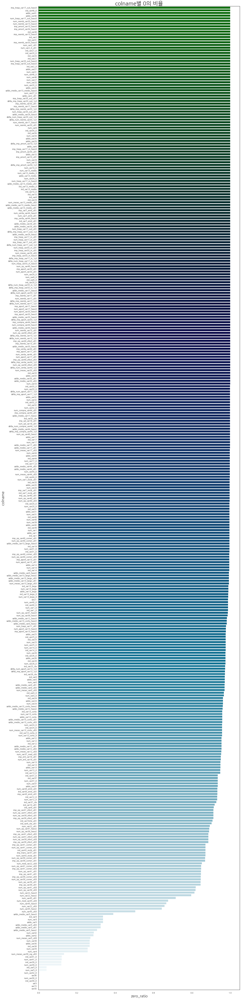

In [10]:
# 각 컬럼별로 0이 비율이 얼마나 되는지를 확인
show_zerocol_ratio(X_DATA)

0의 비중의 높은 컬럼들이 다수존재함을 확인하고 해당컬럼을 제거한다.
모두 0인 컬럼을 모두 제거함

### 0의 비율이 k % 이상되는 컬럼을 제거

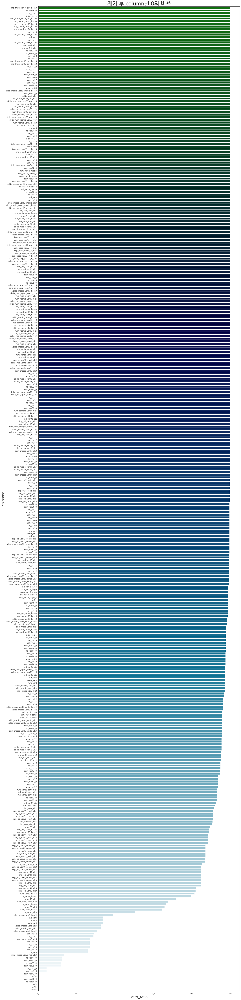

(76020, 335)

In [308]:
# 0의 비율이 100% 이상되는 컬럼을 제거한다.
zero_col_drop(X_DATA,1)
X_DATA.shape

**컬럼별 boxplot를 확인한다**

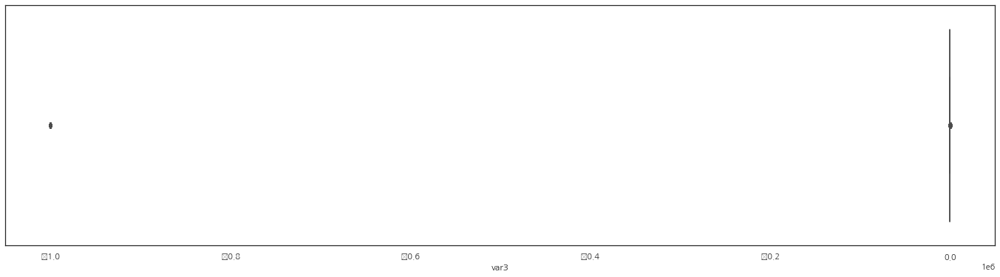

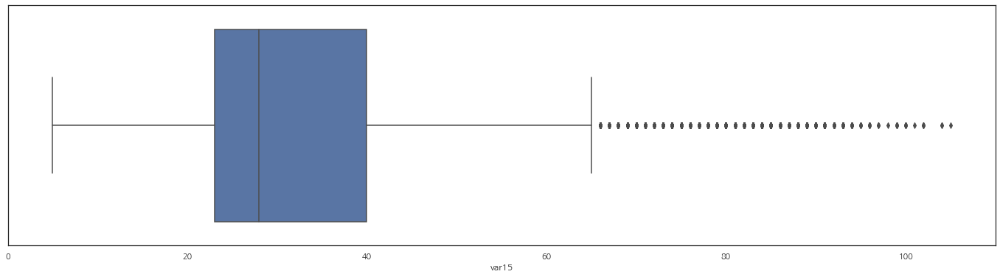

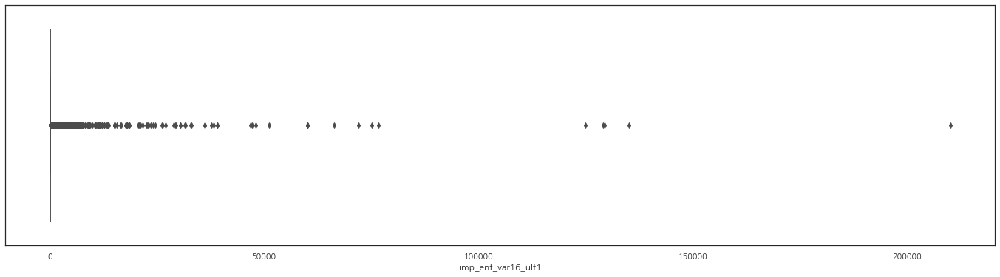

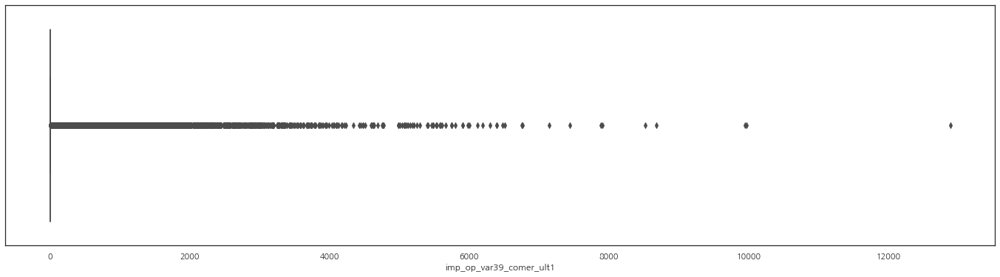

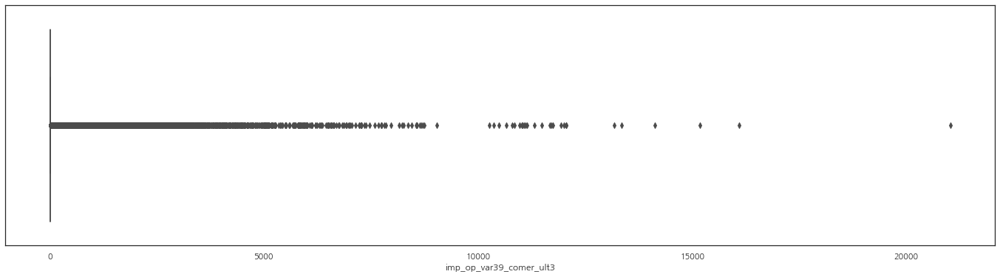

...

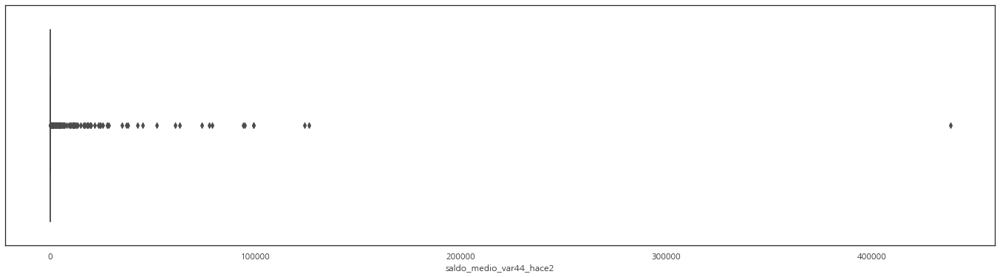

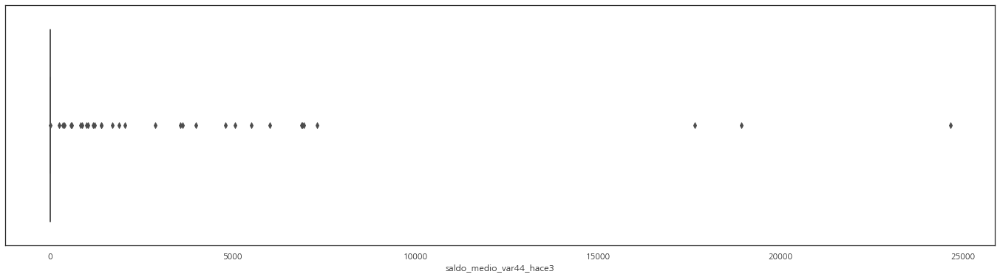

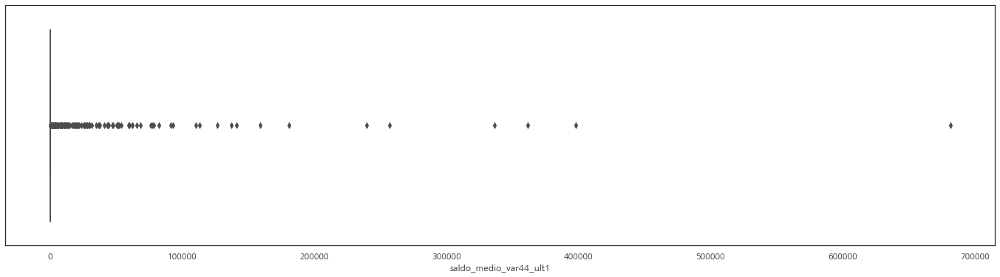

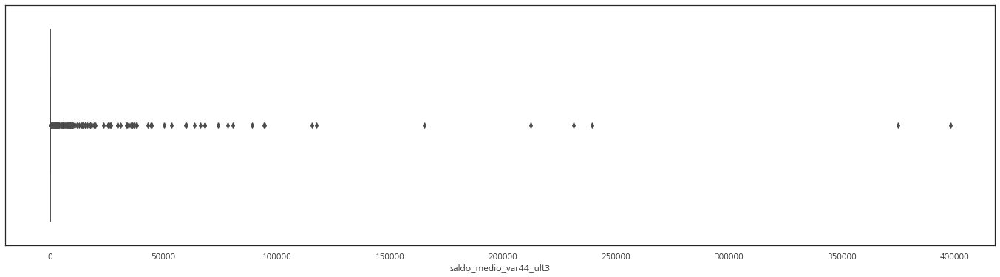

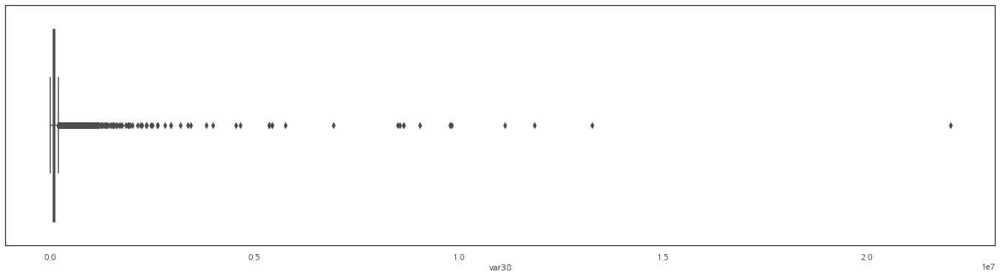

In [12]:
for col in X_DATA.columns:
    plt.figure(figsize=(24,6))
    sns.boxplot(x = X_DATA[col])
    plt.show()

**컬럼별 distplot을 확인한다**

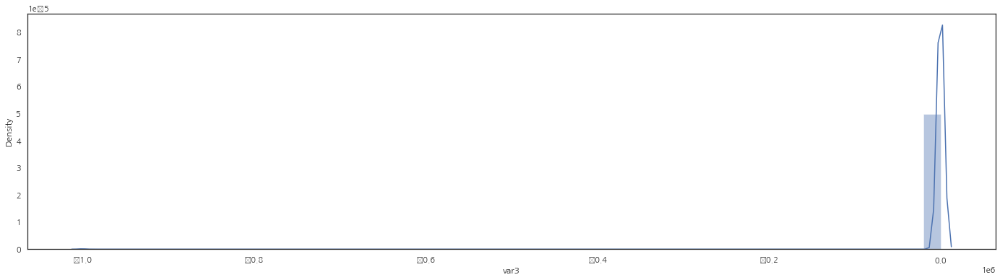

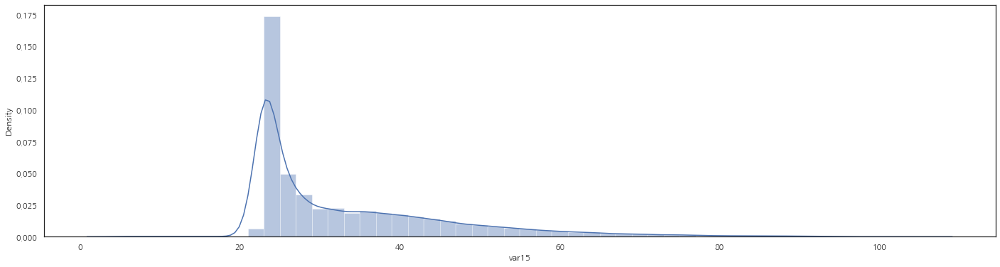

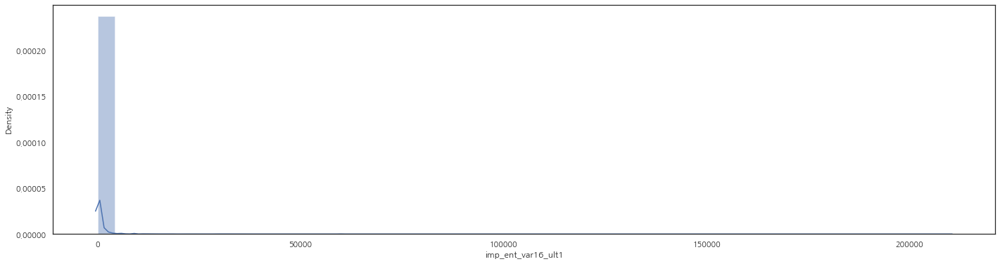

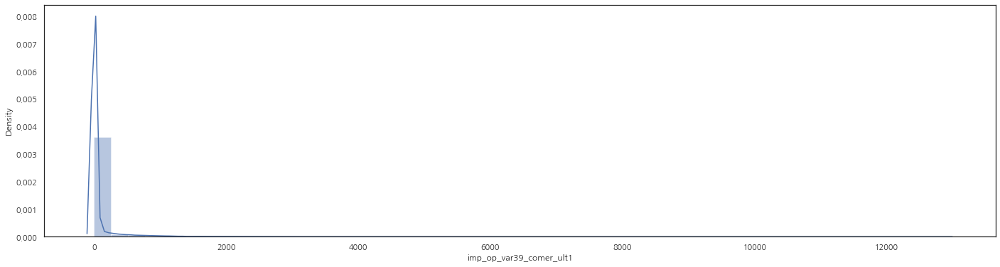

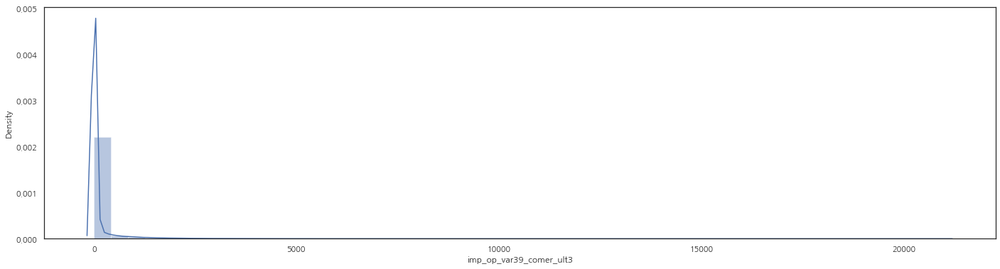

...

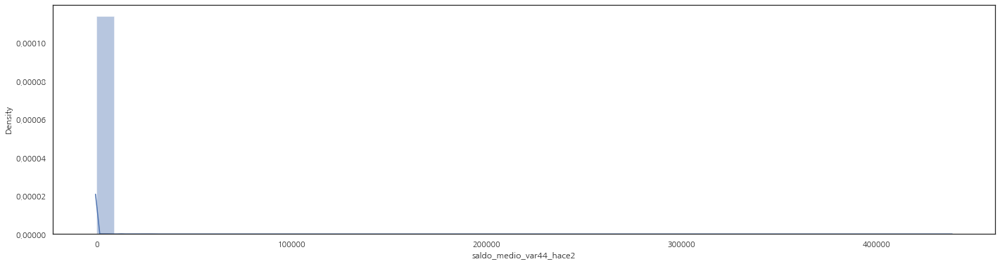

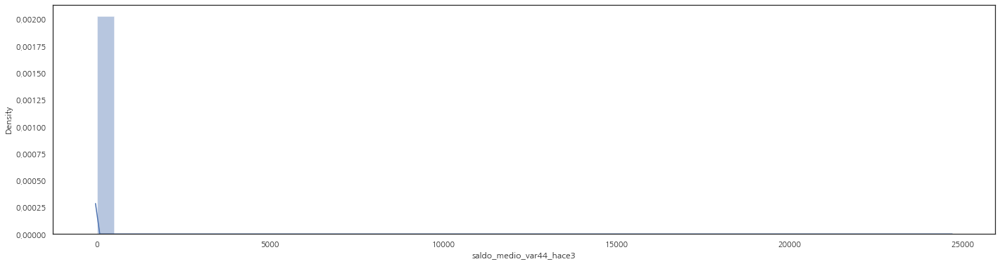

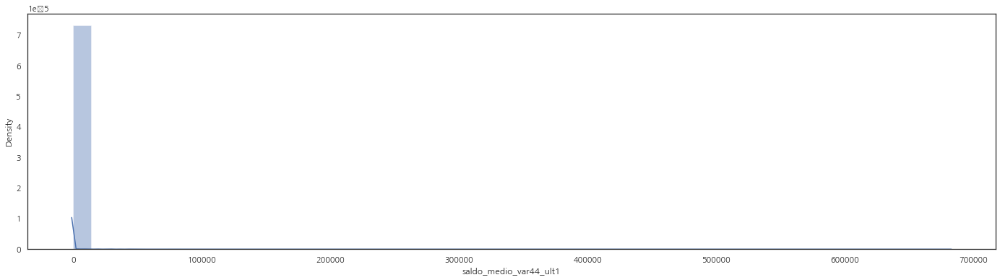

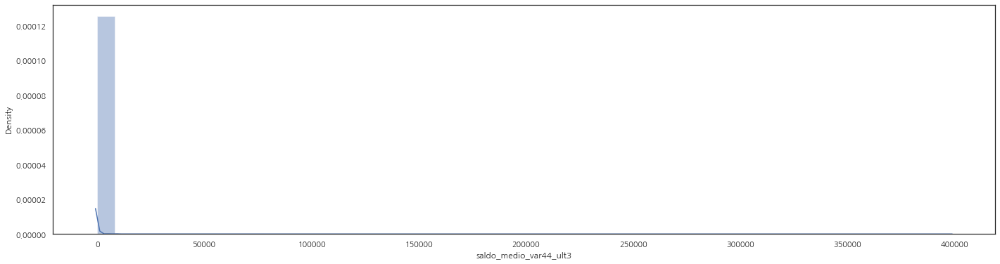

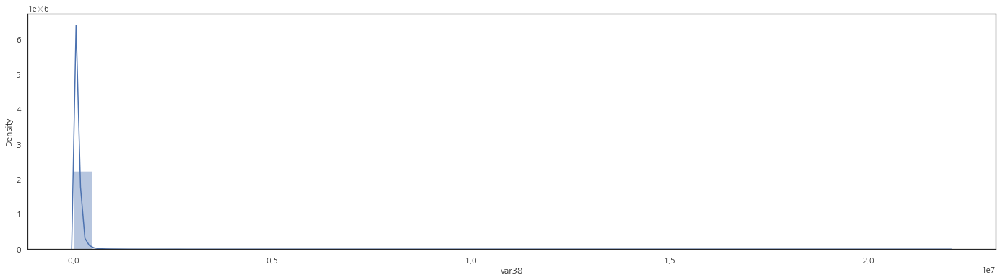

In [13]:
for col in X_DATA.columns:
    plt.figure(figsize=(24,6))
    sns.distplot(X_DATA[col])
    plt.show()

**Feature별 boxplot , distplot를 확인결과 0의 비중이 높고, 극단치 존재, value count가 낮은 컬럼이 sparse 하게 존재함을 확인**

### Feature 별 Outlier를 확인하여 극대치 , 극소치를 대치함

In [309]:
#극대치 확인 
X_DATA.describe().T['max'].sort_values(ascending=False).to_frame().head(30)

,max
delta_imp_reemb_var13_1y3,1.000000e+10
delta_imp_aport_var17_1y3,1.000000e+10
delta_imp_compra_var44_1y3,1.000000e+10
delta_num_aport_var17_1y3,1.000000e+10
delta_imp_reemb_var17_1y3,1.000000e+10
delta_imp_reemb_var33_1y3,1.000000e+10
delta_imp_trasp_var17_in_1y3,1.000000e+10
delta_imp_trasp_var17_out_1y3,1.000000e+10
delta_imp_trasp_var33_in_1y3,1.000000e+10
delta_imp_trasp_var33_out_1y3,1.000000e+10


delta_imp_aport_var13_1y3 , delta_num_aport_var13_1y3 컬럼 등 다수의 컬럼이 극대치가 있음을 확인함

In [310]:
#극소치 확인 함
X_DATA.describe().T['min'].sort_values(ascending=True).to_frame()

,min
var3,-999999.00
saldo_var42,-4942.26
saldo_var30,-4942.26
saldo_var8,-4942.26
saldo_medio_var8_ult1,-3401.34
...,...
num_var26_0,0.00
num_var24,0.00
num_op_var40_ult3,0.00
var15,5.00


**극대치를 확인함**

In [311]:
max_df = X_DATA.describe().T['max'].sort_values(ascending=False).to_frame()
remove_list = max_df[max_df['max']==9999999999].index
remove_list

Index(['delta_imp_reemb_var13_1y3', 'delta_imp_aport_var17_1y3',
       'delta_imp_compra_var44_1y3', 'delta_num_aport_var17_1y3',
       'delta_imp_reemb_var17_1y3', 'delta_imp_reemb_var33_1y3',
       'delta_imp_trasp_var17_in_1y3', 'delta_imp_trasp_var17_out_1y3',
       'delta_imp_trasp_var33_in_1y3', 'delta_imp_trasp_var33_out_1y3',
       'delta_imp_venta_var44_1y3', 'delta_num_aport_var13_1y3',
       'delta_num_venta_var44_1y3', 'delta_num_trasp_var33_out_1y3',
       'delta_num_trasp_var33_in_1y3', 'delta_num_trasp_var17_out_1y3',
       'delta_num_trasp_var17_in_1y3', 'delta_num_reemb_var33_1y3',
       'delta_num_reemb_var17_1y3', 'delta_num_reemb_var13_1y3',
       'delta_num_compra_var44_1y3', 'delta_imp_aport_var33_1y3',
       'delta_num_aport_var33_1y3', 'delta_imp_aport_var13_1y3',
       'delta_imp_amort_var18_1y3', 'delta_imp_amort_var34_1y3'],
      dtype='object')

**극대치를 최빈값으로 대치함**

In [312]:
remove_outlier_max(X_DATA,remove_list)

**극소치를 최빈값으로 대치함**

In [313]:
remove_outlier_min(X_DATA,['var3'])

### 중복되는 Feature을 모두삭제

In [314]:
remove_dup_columns(X_DATA)

중복컬럼 제거전 shape : (76020, 335)
중복컬럼 제거후 shape : (76020, 301)


### 반올림하여  mean , std , median 이 모두 0 인 Feature을 삭제

**각 컬럼별로 mean,max,min,std,median을 확인한다.**

In [315]:
X_DATA_mean = X_DATA.describe().T['mean'].sort_values(ascending=False).to_frame()
X_DATA_std = X_DATA.describe().T['std'].sort_values(ascending=False).to_frame()
X_DATA_max = X_DATA.describe().T['max'].sort_values(ascending=False).to_frame()
X_DATA_median = X_DATA.describe().T['50%'].sort_values(ascending=False).to_frame()
X_DATA_min = X_DATA.describe().T['min'].sort_values(ascending=False).to_frame()

X_DATA_mean.rename(columns = {'mean': 'value'}, inplace = True)
X_DATA_std.rename(columns = {'std' : 'value'}, inplace = True)
X_DATA_max.rename(columns = {'max' : 'value'}, inplace = True)
X_DATA_median.rename(columns = {'50%' : 'value'}, inplace = True)
X_DATA_min.rename(columns = {'min' : 'value'}, inplace = True)

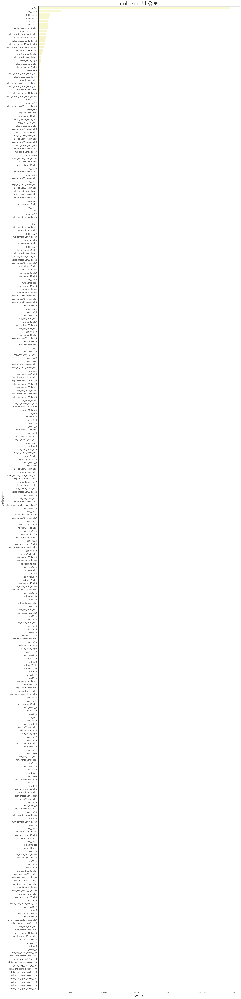

,value
var38,117235.809430
saldo_var30,13679.673658
saldo_var42,7191.725395
saldo_var13,6487.948263
saldo_var12,6021.615901
...,...
delta_imp_aport_var17_1y3,-0.000192
delta_num_aport_var33_1y3,-0.000230
delta_imp_aport_var33_1y3,-0.000285
delta_imp_aport_var13_1y3,-0.021823


In [59]:
# 컬럼별 mean 값 확인
col_info_visual(X_DATA_mean)

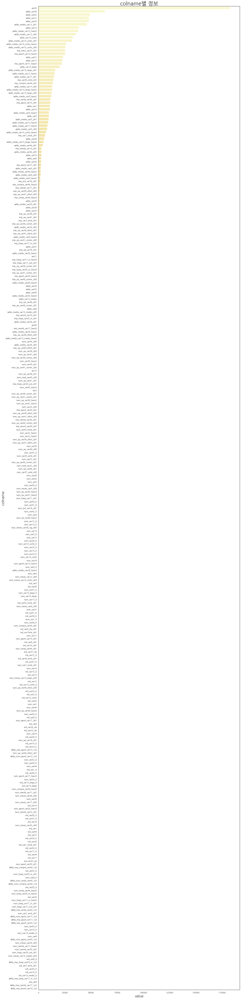

,value
var38,182664.598503
saldo_var30,63014.078142
saldo_var42,49145.313879
saldo_var12,48144.713970
saldo_var24,48008.529342
...,...
ind_var13_medio_0,0.005129
delta_imp_trasp_var17_in_1y3,0.005129
ind_var6,0.005129
delta_imp_reemb_var17_1y3,0.003627


In [60]:
# 컬럼별 표준편차 값 확인
col_info_visual(X_DATA_std)

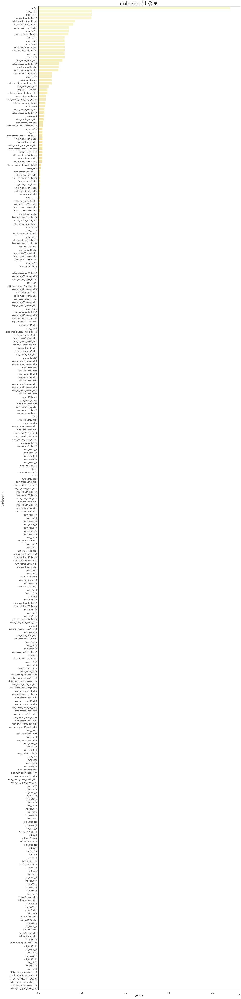

,value
var38,22034738.76
saldo_var31,6119500.14
saldo_var17,6119500.14
imp_aport_var17_hace3,6083691.87
saldo_medio_var17_hace2,4210084.23
...,...
delta_imp_trasp_var33_in_1y3,0.00
delta_imp_trasp_var17_in_1y3,0.00
delta_imp_reemb_var17_1y3,0.00
delta_imp_amort_var18_1y3,0.00


In [61]:
# 컬럼별 max 값 확인
col_info_visual(X_DATA_max)

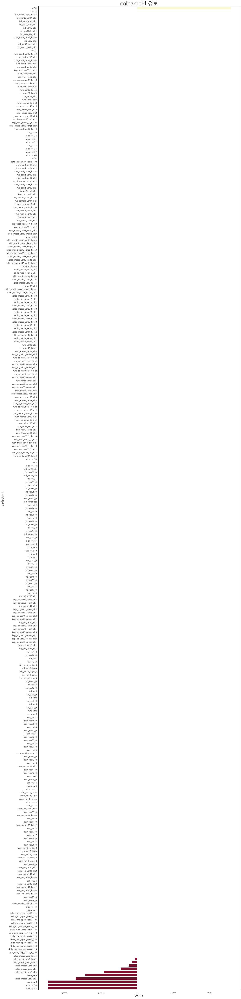

,value
var38,5163.75
var15,5.00
imp_venta_var44_hace3,0.00
imp_venta_var44_ult1,0.00
ind_var7_emit_ult1,0.00
...,...
saldo_var5,-2895.72
saldo_medio_var8_ult1,-3401.34
saldo_var8,-4942.26
saldo_var30,-4942.26


In [62]:
# 컬럼별 min 값 확인
col_info_visual(X_DATA_min)

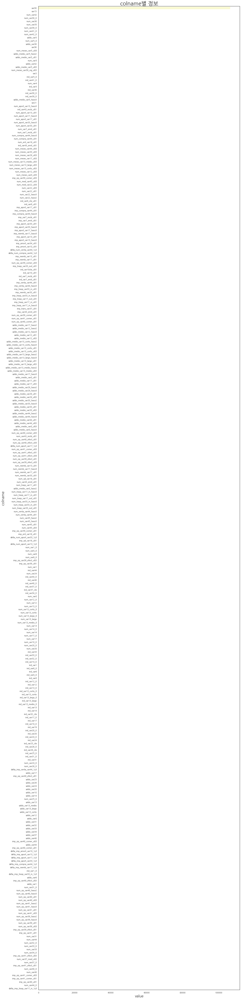

,value
var38,106409.16
var15,28.00
num_var42,3.00
num_var30_0,3.00
num_var30,3.00
...,...
imp_op_var41_comer_ult3,0.00
imp_op_var41_comer_ult1,0.00
imp_op_var40_ult1,0.00
num_var44_0,0.00


In [63]:
# 컬럼별 median 값 확인
col_info_visual(X_DATA_median)

**반올림하여  mean , std , median 이 모두 0 인 컬럼을 확인한다.**

In [316]:
list_mean   = X_DATA_mean[np.round(X_DATA_mean.value,1) ==0].index.to_list()
list_std    = X_DATA_std[np.round(X_DATA_std.value) == 0].index.to_list()
list_median = X_DATA_median[np.round(X_DATA_median.value,1) ==0].index.to_list()
intersection = list(set(list_mean) & set(list_std) & set(list_median))
intersection

['num_trasp_var17_out_ult1',
 'num_meses_var13_medio_ult3',
 'num_aport_var17_hace3',
 'num_meses_var13_largo_ult3',
 'num_trasp_var33_in_ult1',
 'num_var31_0',
 'ind_var32_cte',
 'ind_var13_largo',
 'num_aport_var33_hace3',
 'num_trasp_var33_in_hace3',
 'ind_var6_0',
 'num_var33_0',
 'ind_var7_recib_ult1',
 'delta_num_venta_var44_1y3',
 'ind_var31',
 'num_meses_var29_ult3',
 'num_meses_var33_ult3',
 'ind_var1_0',
 'ind_var40_0',
 'ind_var14',
 'ind_var13_corto_0',
 'num_meses_var17_ult3',
 'ind_var20_0',
 'num_var14',
 'num_var40_0',
 'num_trasp_var17_in_ult1',
 'num_var40',
 'num_var1',
 'num_var13_largo_0',
 'ind_var33',
 'ind_var19',
 'num_var6_0',
 'ind_var12',
 'num_var17',
 'ind_var25_cte',
 'num_op_var40_efect_ult3',
 'num_compra_var44_hace3',
 'ind_var13_largo_0',
 'ind_var8_0',
 'num_compra_var44_ult1',
 'num_var32_0',
 'num_var7_recib_ult1',
 'num_var44_0',
 'delta_imp_trasp_var17_in_1y3',
 'ind_var18_0',
 'delta_imp_amort_var18_1y3',
 'num_reemb_var13_ult1',
 'delta_imp_apo

In [317]:
# 반올림하여  mean , std , median 이 모두 0 인 컬럼을 삭제한다.
X_DATA.drop(intersection,axis=1, inplace=True)

In [318]:
X_DATA.shape

(76020, 194)

### Feature별로 상관계수를 확인하여 k 이상인 Feature를 제거함

**Feature별 correlation 확인**

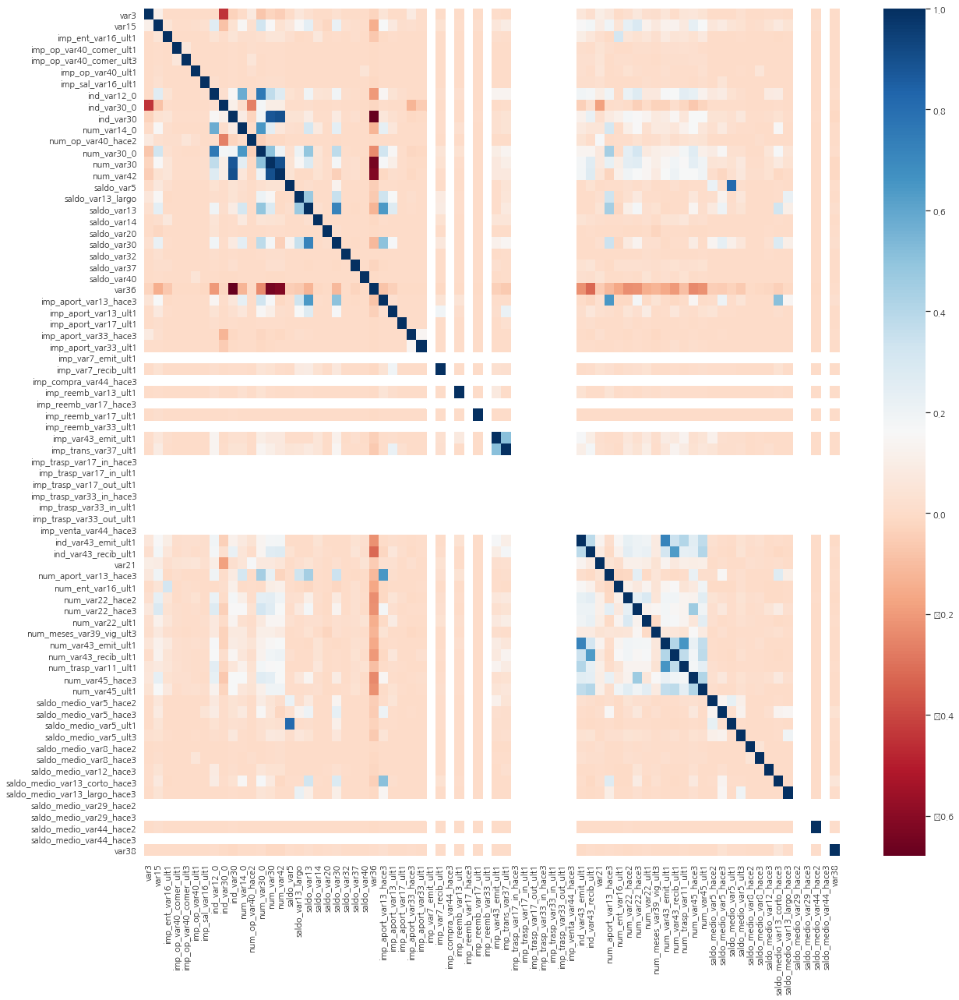

In [354]:
plt.figure(figsize=(20,20))
corr = X_DATA.corr()
sns.heatmap(corr,cmap='RdBu')
plt.show()

In [325]:
remove_corr_over(X_DATA,0.9)

(76020, 74)


### Feature별 value_counts 가 1인 value를 갖는 data point를 찾아 최빈값으로 대치

boxplot 확인시 컬럼별로 value_counts 가 1인 data point들이 다수 존재함을 확인

In [321]:
collist=[]
cntlist=[]
for col in X_DATA.columns:
    df_cnt= pd.DataFrame([X_DATA[[col]].value_counts()],index=None).T
    df_cnt.reset_index(inplace=True)
    df_cnt.rename(columns = {col: 'value',0:'count'}, inplace = True)
    df_cntone = df_cnt[df_cnt['count'] ==1].value
    collist.append(col)
    cntlist.append(df_cntone.shape[0])

df_onecount = pd.DataFrame([collist,cntlist],index=['col_nm','one_count']).T

In [322]:
df_onecount.sort_values(by='one_count', ascending=False)

,col_nm,one_count
77,var38,54860
22,saldo_var30,14681
65,saldo_medio_var5_ult3,13631
64,saldo_medio_var5_ult1,12244
62,saldo_medio_var5_hace2,11801
...,...,...
11,ind_var30,0
48,ind_var43_emit_ult1,0
49,ind_var43_recib_ult1,0
56,num_meses_var39_vig_ult3,0


In [323]:
to_mode_colcnt1(X_DATA)

In [324]:
X_DATA.shape

(76020, 78)

### scaling적용

In [327]:
X_DATA_SC= fe_scaling(preprocessing.Normalizer(), X_DATA)

### PCA적용

In [278]:
X_DATA_SC_PCA = apply_pca(X_DATA_SC,20)

PCA적용후 shape :  (76020, 20)


## TRAIN , TEST 분리

In [328]:
X_train , X_test , y_train , y_test = func_train_test_sp(X_DATA_SC,y_DATA)

X_train Shape : (60816, 74)
y_train Shape : (60816,)
0    0.960438
1    0.039562
Name: TARGET, dtype: float64
X_test Shape : (15204, 74)
y_test Shape : (15204,)
0    0.960405
1    0.039595
Name: TARGET, dtype: float64


## Oversampling 적용

In [329]:
X_resampled, y_resampled = apply_smote_oversam(X_train,y_train)

(116820, 74)
(116820,)
0    58410
1    58410
Name: TARGET, dtype: int64


## 모델적용

### XG Boost

In [330]:
from xgboost import XGBClassifier

In [331]:
params = {
    'max_depth' : ['5','7','9'],
    'min_child_weight' : [1,3],
    'colsample_bytree' : [0.5 , 0.75]
}

In [332]:
gs_xb = GridSearchCV(estimator=XGBClassifier(n_estimators=100),
                     param_grid=params,
                     cv=2,
                     verbose=1)

In [333]:
gs_xb.fit(X_resampled , y_resampled , early_stopping_rounds=30 , eval_metric='auc',
         eval_set = [(X_resampled , y_resampled) , (X_test, y_test)])

Fitting 2 folds for each of 12 candidates, totalling 24 fits
[0]	validation_0-auc:0.85400	validation_1-auc:0.78706
[1]	validation_0-auc:0.87498	validation_1-auc:0.77682
[2]	validation_0-auc:0.88714	validation_1-auc:0.77427
[3]	validation_0-auc:0.89151	validation_1-auc:0.76982
[4]	validation_0-auc:0.89268	validation_1-auc:0.76915
[5]	validation_0-auc:0.89655	validation_1-auc:0.77148
[6]	validation_0-auc:0.90214	validation_1-auc:0.78223
[7]	validation_0-auc:0.90755	validation_1-auc:0.77979
[8]	validation_0-auc:0.91035	validation_1-auc:0.78963
[9]	validation_0-auc:0.91407	validation_1-auc:0.78558
[10]	validation_0-auc:0.92084	validation_1-auc:0.78328
[11]	validation_0-auc:0.92425	validation_1-auc:0.77972
[12]	validation_0-auc:0.92600	validation_1-auc:0.77761
[13]	validation_0-auc:0.92762	validation_1-auc:0.78252
[14]	validation_0-auc:0.92854	validation_1-auc:0.78502
[15]	validation_0-auc:0.92965	validation_1-auc:0.78426
[16]	validation_0-auc:0.93302	validation_1-auc:0.78130
[17]	validatio

[32]	validation_0-auc:0.94639	validation_1-auc:0.79671
[33]	validation_0-auc:0.94666	validation_1-auc:0.79642
[34]	validation_0-auc:0.94745	validation_1-auc:0.79459
[35]	validation_0-auc:0.94789	validation_1-auc:0.79539
[36]	validation_0-auc:0.94869	validation_1-auc:0.79417
[37]	validation_0-auc:0.94974	validation_1-auc:0.79506
[38]	validation_0-auc:0.94985	validation_1-auc:0.79497
[0]	validation_0-auc:0.88296	validation_1-auc:0.78739
[1]	validation_0-auc:0.89961	validation_1-auc:0.77880
[2]	validation_0-auc:0.90861	validation_1-auc:0.77095
[3]	validation_0-auc:0.91553	validation_1-auc:0.76655
[4]	validation_0-auc:0.91775	validation_1-auc:0.76566
[5]	validation_0-auc:0.91813	validation_1-auc:0.76248
[6]	validation_0-auc:0.92288	validation_1-auc:0.77483
[7]	validation_0-auc:0.92738	validation_1-auc:0.77066
[8]	validation_0-auc:0.92960	validation_1-auc:0.78112
[9]	validation_0-auc:0.93203	validation_1-auc:0.77828
[10]	validation_0-auc:0.93569	validation_1-auc:0.77445
[11]	validation_0-au

[26]	validation_0-auc:0.95470	validation_1-auc:0.78958
[27]	validation_0-auc:0.95585	validation_1-auc:0.78988
[28]	validation_0-auc:0.95618	validation_1-auc:0.79019
[29]	validation_0-auc:0.95627	validation_1-auc:0.78973
[30]	validation_0-auc:0.95721	validation_1-auc:0.78986
[31]	validation_0-auc:0.95745	validation_1-auc:0.78984
[32]	validation_0-auc:0.95778	validation_1-auc:0.78942
[33]	validation_0-auc:0.95808	validation_1-auc:0.78969
[34]	validation_0-auc:0.95869	validation_1-auc:0.78838
[35]	validation_0-auc:0.95911	validation_1-auc:0.78770
[36]	validation_0-auc:0.95938	validation_1-auc:0.78678
[37]	validation_0-auc:0.95970	validation_1-auc:0.78685
[38]	validation_0-auc:0.95988	validation_1-auc:0.78710
[39]	validation_0-auc:0.96074	validation_1-auc:0.78743
[40]	validation_0-auc:0.96082	validation_1-auc:0.78776
[41]	validation_0-auc:0.96088	validation_1-auc:0.78811
[42]	validation_0-auc:0.96099	validation_1-auc:0.78791
[43]	validation_0-auc:0.96111	validation_1-auc:0.78732
[0]	valida

[15]	validation_0-auc:0.95554	validation_1-auc:0.78936
[16]	validation_0-auc:0.95691	validation_1-auc:0.78636
[17]	validation_0-auc:0.95875	validation_1-auc:0.78661
[18]	validation_0-auc:0.95901	validation_1-auc:0.78757
[19]	validation_0-auc:0.95950	validation_1-auc:0.78591
[20]	validation_0-auc:0.96038	validation_1-auc:0.78604
[21]	validation_0-auc:0.96106	validation_1-auc:0.78487
[22]	validation_0-auc:0.96185	validation_1-auc:0.78692
[23]	validation_0-auc:0.96219	validation_1-auc:0.78770
[24]	validation_0-auc:0.96348	validation_1-auc:0.78841
[25]	validation_0-auc:0.96364	validation_1-auc:0.78865
[26]	validation_0-auc:0.96398	validation_1-auc:0.78891
[27]	validation_0-auc:0.96419	validation_1-auc:0.78833
[28]	validation_0-auc:0.96485	validation_1-auc:0.78689
[29]	validation_0-auc:0.96488	validation_1-auc:0.78692
[30]	validation_0-auc:0.96535	validation_1-auc:0.78711
[0]	validation_0-auc:0.85550	validation_1-auc:0.78976
[1]	validation_0-auc:0.86963	validation_1-auc:0.79449
[2]	validati

[18]	validation_0-auc:0.93404	validation_1-auc:0.80395
[19]	validation_0-auc:0.93628	validation_1-auc:0.80429
[20]	validation_0-auc:0.93672	validation_1-auc:0.80424
[21]	validation_0-auc:0.93837	validation_1-auc:0.80092
[22]	validation_0-auc:0.93978	validation_1-auc:0.79978
[23]	validation_0-auc:0.94076	validation_1-auc:0.79939
[24]	validation_0-auc:0.94107	validation_1-auc:0.80060
[25]	validation_0-auc:0.94138	validation_1-auc:0.79951
[26]	validation_0-auc:0.94167	validation_1-auc:0.79958
[27]	validation_0-auc:0.94211	validation_1-auc:0.79851
[28]	validation_0-auc:0.94303	validation_1-auc:0.79703
[29]	validation_0-auc:0.94388	validation_1-auc:0.79823
[30]	validation_0-auc:0.94427	validation_1-auc:0.79720
[31]	validation_0-auc:0.94481	validation_1-auc:0.79680
[32]	validation_0-auc:0.94542	validation_1-auc:0.79669
[33]	validation_0-auc:0.94625	validation_1-auc:0.79544
[34]	validation_0-auc:0.94669	validation_1-auc:0.79559
[35]	validation_0-auc:0.94705	validation_1-auc:0.79532
[36]	valid

[17]	validation_0-auc:0.94889	validation_1-auc:0.79513
[18]	validation_0-auc:0.94961	validation_1-auc:0.79429
[19]	validation_0-auc:0.95093	validation_1-auc:0.79458
[20]	validation_0-auc:0.95141	validation_1-auc:0.79459
[21]	validation_0-auc:0.95198	validation_1-auc:0.79413
[22]	validation_0-auc:0.95253	validation_1-auc:0.79402
[23]	validation_0-auc:0.95327	validation_1-auc:0.79237
[24]	validation_0-auc:0.95375	validation_1-auc:0.79235
[25]	validation_0-auc:0.95436	validation_1-auc:0.79266
[26]	validation_0-auc:0.95518	validation_1-auc:0.79201
[27]	validation_0-auc:0.95527	validation_1-auc:0.79203
[28]	validation_0-auc:0.95559	validation_1-auc:0.79138
[29]	validation_0-auc:0.95620	validation_1-auc:0.79217
[30]	validation_0-auc:0.95652	validation_1-auc:0.79187
[31]	validation_0-auc:0.95692	validation_1-auc:0.79240
[32]	validation_0-auc:0.95705	validation_1-auc:0.79175
[33]	validation_0-auc:0.95739	validation_1-auc:0.79117
[34]	validation_0-auc:0.95775	validation_1-auc:0.79074
[35]	valid

[15]	validation_0-auc:0.95558	validation_1-auc:0.79329
[16]	validation_0-auc:0.95639	validation_1-auc:0.79142
[17]	validation_0-auc:0.95768	validation_1-auc:0.79137
[18]	validation_0-auc:0.95834	validation_1-auc:0.79148
[19]	validation_0-auc:0.95902	validation_1-auc:0.79213
[20]	validation_0-auc:0.95986	validation_1-auc:0.79211
[21]	validation_0-auc:0.96002	validation_1-auc:0.79118
[22]	validation_0-auc:0.96096	validation_1-auc:0.79129
[23]	validation_0-auc:0.96133	validation_1-auc:0.79110
[24]	validation_0-auc:0.96257	validation_1-auc:0.78956
[25]	validation_0-auc:0.96290	validation_1-auc:0.78980
[26]	validation_0-auc:0.96315	validation_1-auc:0.78931
[27]	validation_0-auc:0.96330	validation_1-auc:0.78917
[28]	validation_0-auc:0.96354	validation_1-auc:0.78843
[29]	validation_0-auc:0.96362	validation_1-auc:0.78813
[30]	validation_0-auc:0.96389	validation_1-auc:0.78781
[31]	validation_0-auc:0.96398	validation_1-auc:0.78724
[32]	validation_0-auc:0.96418	validation_1-auc:0.78690
[33]	valid

GridSearchCV(cv=2,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None,

**best parameter 및 모델평가**

In [334]:
print(gs_xb.best_params_)
y_pred       = gs_xb.predict(X_test)
y_pred_proba = gs_xb.predict_proba(X_test)[:,1]
get_cla_evl(y_test , y_pred , y_pred_proba)

{'colsample_bytree': 0.75, 'max_depth': '9', 'min_child_weight': 1}
[[12363  2239]
 [  246   356]]


,accuracy,precision,recall,f1_score,roc_auc
Score,0.837,0.137,0.591,0.223,0.79


### Logistic Regression

In [335]:
from sklearn.linear_model import LogisticRegression

In [336]:
params={
    'penalty':['l2','l1'],
    'C':[0.01,0.1,1,2,4]
}

In [337]:
gs_clf = GridSearchCV(estimator=LogisticRegression(random_state=1234),
                     param_grid=params,
                     scoring='roc_auc',
                     #cv=kfold,
                     cv=3,
                     verbose=2,
                     n_jobs=-1)

In [338]:
gs_clf.fit(X_resampled,y_resampled)
# gs_clf.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


GridSearchCV(cv=3, estimator=LogisticRegression(random_state=1234), n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 1, 2, 4], 'penalty': ['l2', 'l1']},
             scoring='roc_auc', verbose=2)

In [339]:
print(gs_clf.best_params_)
y_pred       = gs_clf.predict(X_test)
y_pred_proba = gs_clf.predict_proba(X_test)[:,1]
get_cla_evl(y_test , y_pred , y_pred_proba)

{'C': 4, 'penalty': 'l2'}
[[ 2319 12283]
 [   35   567]]


,accuracy,precision,recall,f1_score,roc_auc
Score,0.19,0.044,0.942,0.084,0.721


### RandomForest

In [340]:
from sklearn.ensemble import RandomForestClassifier

In [341]:
params = {
    'n_estimators' : [50,75,100],
    'max_features' : ['sqrt','log2']
}

In [342]:
gs_rf = GridSearchCV(estimator=RandomForestClassifier(random_state=1234),
                     param_grid=params,
                     scoring='roc_auc',
                     #cv=kfold,
                     cv=3,
                     verbose=2,
                     n_jobs=-1)

In [343]:
gs_rf.fit(X_resampled,y_resampled)
# gs_rf.fit(X_train,y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(random_state=1234),
             n_jobs=-1,
             param_grid={'max_features': ['sqrt', 'log2'],
                         'n_estimators': [50, 75, 100]},
             scoring='roc_auc', verbose=2)

In [344]:
print(gs_rf.best_params_)
y_pred       = gs_rf.predict(X_test)
y_pred_proba = gs_rf.predict_proba(X_test)[:,1]
get_cla_evl(y_test , y_pred , y_pred_proba)

{'max_features': 'sqrt', 'n_estimators': 100}
[[12971  1631]
 [  321   281]]


,accuracy,precision,recall,f1_score,roc_auc
Score,0.872,0.147,0.467,0.224,0.775


### Light GBM

In [345]:
from lightgbm import LGBMClassifier

In [346]:
params = {
    'num_leaves' : [16,32,64],
    'max_depth' : [128,160],
    'min_child_sample':[60,100],
    'subsample':[0.8,1]
}

In [347]:
gs_lgbm = GridSearchCV(estimator=LGBMClassifier(n_estimators=200),
                     param_grid=params,
                     scoring='roc_auc',
                     #cv=kfold,
                     cv=3,
                     verbose=2,
                     n_jobs=-1)

In [348]:
gs_lgbm.fit(X_resampled,y_resampled)
# gs_lgbm.fit(X_train,y_train)

Fitting 3 folds for each of 24 candidates, totalling 72 fits
[LightGBM] [Warning] Unknown parameter: min_child_sample


GridSearchCV(cv=3, estimator=LGBMClassifier(n_estimators=200), n_jobs=-1,
             param_grid={'max_depth': [128, 160], 'min_child_sample': [60, 100],
                         'num_leaves': [16, 32, 64], 'subsample': [0.8, 1]},
             scoring='roc_auc', verbose=2)

In [349]:
print(gs_lgbm.best_params_)
y_pred       = gs_lgbm.predict(X_test)
y_pred_proba = gs_lgbm.predict_proba(X_test)[:,1]
get_cla_evl(y_test , y_pred , y_pred_proba)

{'max_depth': 128, 'min_child_sample': 60, 'num_leaves': 64, 'subsample': 0.8}
[[13049  1553]
 [  337   265]]


,accuracy,precision,recall,f1_score,roc_auc
Score,0.876,0.146,0.44,0.219,0.773


### Stacking 적용

In [350]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

# 개별 Classifier 생성.
knn_clf  = KNeighborsClassifier(n_neighbors=4)
rf_clf   = RandomForestClassifier(n_estimators=100, random_state=0,max_features='sqrt')
dt_clf   = DecisionTreeClassifier()
ada_clf  = AdaBoostClassifier(n_estimators=100)

# 최종 Stacking 모델을 위한 Classifier생성. 
lr_final = LogisticRegression(C=0.01, penalty='l2')

# 개별 모델들을 학습. 
knn_clf.fit(X_resampled, y_resampled)
rf_clf.fit(X_resampled , y_resampled)
dt_clf.fit(X_resampled , y_resampled)
ada_clf.fit(X_resampled, y_resampled)

# Meta-learner가 학습하기 위한 데이터 셋을 생성
knn_pred_train = knn_clf.predict(X_resampled)
rf_pred_train = rf_clf.predict(X_resampled)
dt_pred_train = dt_clf.predict(X_resampled)
ada_pred_train = ada_clf.predict(X_resampled)

meta_train = np.array([
    knn_pred_train, rf_pred_train, dt_pred_train, ada_pred_train
])
print(meta_train.shape)

# transpose를 이용해 행과 열의 위치 교환. 컬럼 레벨로 각 알고리즘의 예측 결과를 피처로 만듦. 
meta_train = np.transpose(meta_train)
print(meta_train.shape)

# Meta-learner 학습
lr_final.fit(meta_train, y_resampled)

(4, 116820)
(116820, 4)


LogisticRegression(C=0.01)

In [351]:
# 학습된 개별 모델들이 각자 반환하는 예측 데이터 셋을 생성하고 개별 모델의 정확도 측정. 
knn_pred = knn_clf.predict(X_test)
rf_pred = rf_clf.predict(X_test)
dt_pred = dt_clf.predict(X_test)
ada_pred = ada_clf.predict(X_test)

print('KNN Accuracy: {0:.4f}'.format(accuracy_score(y_test, knn_pred)))
print('RF Accuracy: {0:.4f}'.format(accuracy_score(y_test, rf_pred)))
print('DT Accuracy: {0:.4f}'.format(accuracy_score(y_test, dt_pred)))
print('Adaboost Accuracy: {0:.4f}'.format(accuracy_score(y_test, ada_pred)))

KNN Accuracy: 0.8607
RF Accuracy: 0.8715
DT Accuracy: 0.8566
Adaboost Accuracy: 0.6751


In [352]:
pred = np.array([knn_pred, rf_pred, dt_pred, ada_pred])
print(pred.shape)

# transpose를 이용해 행과 열의 위치 교환. 컬럼 레벨로 각 알고리즘의 예측 결과를 피처로 만듦. 
pred = np.transpose(pred)
print(pred.shape)

(4, 15204)
(15204, 4)


In [353]:
# Meta-learner로 최종 예측 결과 도출
final = lr_final.predict(pred)
final_proba = lr_final.predict_proba(pred)[:,1]

get_cla_evl(y_test ,final , final_proba)

[[13114  1488]
 [  362   240]]


,accuracy,precision,recall,f1_score,roc_auc
Score,0.878,0.139,0.399,0.206,0.662
